# Diffusion Probabilistic Model
Reference: https://github.com/acids-ircam/diffusion_models/blob/main/diffusion_03_waveform.ipynb

In [86]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

import code_funcs
import matplotlib.pyplot as plt
import numpy as np
from sklearn.datasets import make_swiss_roll

import json
config_file = open('config.json')
config = json.load(config_file)
print(config)

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
{'spiral': {'data_size': 10000, 'n_steps': 100, 'batch_size': 128, 'epochs': 3501}, 'two_clusters': {'data_size': 10000, 'n_steps': 90, 'batch_size': 128, 'epochs': 701}}


'cuda'

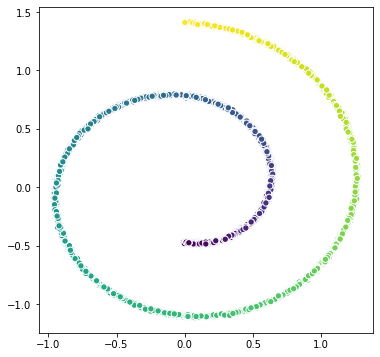

In [68]:
# Plot the swiss roll
spiral_size = config['spiral']['data_size']
spiral, COLOR_SPIRAL  = code_funcs.swiss_roll_data(spiral_size)
plt.figure(figsize=(6, 6))
plt.scatter(*spiral, c=COLOR_SPIRAL, edgecolor='white', s=40);

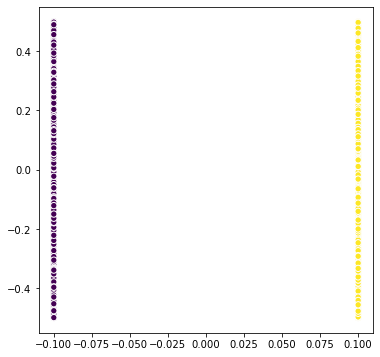

In [69]:
# Plot the two clusters
clusters_size = config['spiral']['data_size']
clusters, COLOR_CLUSTERS = code_funcs.two_clusters_data(clusters_size, spacing=0.2)
plt.figure(figsize=(6, 6))
plt.scatter(*clusters, c=COLOR_CLUSTERS, edgecolor='white', s=40);

## Diffusion probabilistic models

_Diffusion probabilistic models_ [ [ 1 ] ](#ref1) are based on on a series of latent variables $ \mathbf{x}_{1},\cdots,\mathbf{x}_{T}$ that have the same dimensionality as a given input data, which is labeled as $\mathbf{x}_{0} \sim q(\mathbf{x}_{0})$. It models two reciprocal processes as Markov chains of these random variables. One (fixed) process $q(\mathbf{x}_{t}\mid\mathbf{x}_{t-1})$ gradually adds noise to the input data (the _diffusion_ or _forward_ process), destroying the signal up to full noise. Oppositely, the _reverse_ (parametric) process $p_{\theta}(\mathbf{x}_{t-1}\mid\mathbf{x}_{t})$ must learn how to _denoise local perturbations_ in order to invert this diffusion process (transform random noise into a high-quality waveform). Hence, learning involves estimating a _large number of small perturbations_, which is more tractable than trying to directly estimate the full distribution with a single potential function, as examplified in the following figure

<img src="images/diffusion.png" width="100%"/>

Therefore, we need to define the behavior of the two process, and train the _reverse_ process (modeled as conditional Gaussians) using variational inference, which allow for neural network parameterization and tractable estimation.

$$
\text{forward (diffusion)} : q(\mathbf{x}_{t}\mid\mathbf{x}_{t-1})
$$
$$
\text{reverse (parametric)} : p_{\theta}(\mathbf{x}_{t-1}\mid\mathbf{x}_{t})
$$

#### Forward process

In the forward process, the data distribution $q(\mathbf{x}_{0})$ is gradually converted into an analytically tractable distribution $\pi(\mathbf{y})$, by repeated application of a diffusion kernel, so that the complete distribution $q(\mathbf{x}_{0:T})$ (called _diffusion_ process) is defined as

$$
q(\mathbf{x}_{0:T}) =  q(\mathbf{x}_{0}) \prod_{t=1}^{T} q(\mathbf{x}_{t}\mid\mathbf{x}_{t-1})
$$

This diffusion kernel $q(\mathbf{x}_{t}\mid\mathbf{x}_{t-1})$ is set to gradually inject Gaussian noise, with a fixed variance schedule $\beta_{1},\cdots,\beta_{T}$ such that

$$
q(\mathbf{x}_{t}\mid\mathbf{x}_{t-1}) = \mathcal{N}(\mathbf{x}_{t} ; \sqrt{1-\beta_{t}}\mathbf{x}_{t-1},\beta_{t}\mathbf{I})
$$

One important property of this forward process noted by Ho et al. [ [ 1 ] ](#ref1) is that we can perform sampling at any arbitrary timestep $t$, such that

$$
q(\mathbf{x}_{t}\mid\mathbf{x}_{0}) = \mathcal{N}(\mathbf{x}_{t} ; \sqrt{\bar{\alpha}_{t}}\mathbf{x}_{0},(1-\bar{\alpha}_{t})\mathbf{I}),
$$

where $\alpha_{t}=1-\beta_{t}$ and $\bar{\alpha}_{t} = \prod_{s=1}^{t} \alpha_{s}$. Therefore, we can create a very efficient diffusion sampling function. Note that this depends on the given variance schedule of $\beta_{1},\cdots,\beta_{T}$ that we compute prior to the function.


#### Implementing the forward process
This allows to perform a very efficient implementation of the forward process, where we can directly sample at any given timesteps, as shown in the following code.

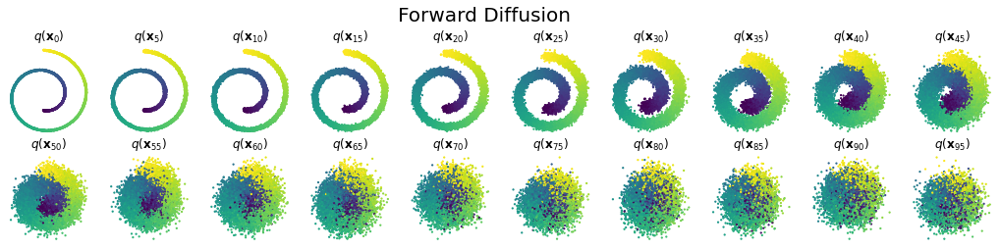

In [70]:
spiral_n_steps = config['spiral']['n_steps']
spiral_dataset = torch.tensor(spiral.T).float().to(device)

code_funcs.plot_diffusion(spiral_dataset, spiral_n_steps, COLOR_SPIRAL, device)

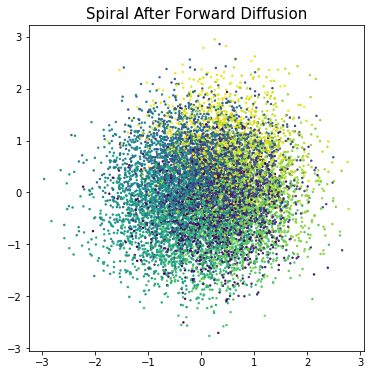

In [71]:
spiral_betas = code_funcs.make_beta_schedule(schedule='sigmoid', n_timesteps=spiral_n_steps, start=1e-5, end=1e-2)
spiral_alphas, spiral_alphas_bar_sqrt, spiral_one_minus_alphas_bar_sqrt = code_funcs.get_variables(spiral_betas, device)

spiral_diffused = code_funcs.q_sample(spiral_dataset, torch.tensor([spiral_n_steps-1]), spiral_alphas_bar_sqrt, spiral_one_minus_alphas_bar_sqrt, device).cpu().detach().numpy()
plt.figure(figsize=(6, 6))
plt.scatter(spiral_diffused[:, 0], spiral_diffused[:, 1], s=2, c=COLOR_SPIRAL) 
plt.title("Spiral After Forward Diffusion", fontsize=15);

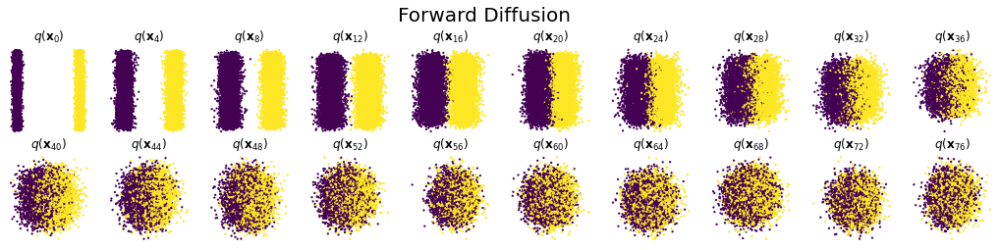

In [72]:
clusters_n_steps = config['two_clusters']['n_steps']
clusters_dataset = torch.tensor(clusters.T).float().to(device)

code_funcs.plot_diffusion(clusters_dataset, clusters_n_steps, COLOR_CLUSTERS, device)

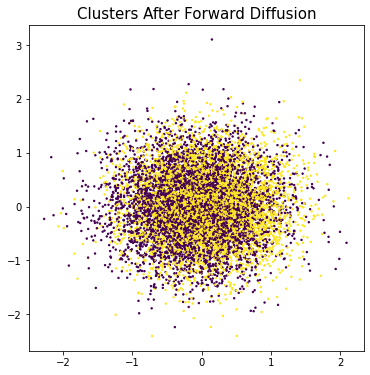

In [73]:
clusters_betas = code_funcs.make_beta_schedule(schedule='sigmoid', n_timesteps=clusters_n_steps, start=1e-5, end=1e-2)
clusters_alphas, clusters_alphas_bar_sqrt, clusters_one_minus_alphas_bar_sqrt = code_funcs.get_variables(clusters_betas, device)

clusters_diffused = code_funcs.q_sample(clusters_dataset, torch.tensor([clusters_n_steps-1]), clusters_alphas_bar_sqrt, clusters_one_minus_alphas_bar_sqrt, device).cpu().detach().numpy()
plt.figure(figsize=(6, 6))
plt.scatter(clusters_diffused[:, 0], clusters_diffused[:, 1], s=2, c=COLOR_CLUSTERS) 
plt.title("Clusters After Forward Diffusion", fontsize=15);

#### Reverse process

The generative distribution that we aim to learn will be trained to perform the _reverse_ trajectory, starting from Gaussian noise to gradually remove local perturbations. Therefore the reverse process starts with our given tractable distribution $p(\mathbf{x}_{T})=\pi(\mathbf{x}_{T})$ and is described as

$$
p_{\theta}(\mathbf{x}_{0:T}) =  p(\mathbf{x}_{T}) \prod_{t=1}^{T} p_{\theta}(\mathbf{x}_{t-1}\mid\mathbf{x}_{t})
$$

Each of the transitions in this process can simply be defined as conditional Gaussians (**note**: which is reminiscent of the definition of VAEs). Therefore, during learning, only the mean and covariancce for a Gaussian diffusion kernel needs to be trained

$$
p_{\theta}(\mathbf{x}_{t-1}\mid\mathbf{x}_{t}) = \mathcal{N}(\mathbf{x}_{t-1} ; \mathbf{\mu}_{\theta}(\mathbf{x}_{t},t),\mathbf{\Sigma}_{\theta}(\mathbf{x}_{t},t))
$$

The two functions defining the mean $\mathbf{\mu}_{\theta}(\mathbf{x}_{t},t)$ and covariance $\mathbf{\Sigma}_{\theta}(\mathbf{x}_{t},t)$ can be parametrized by deep neural networks. Note also that these functions are parametrized by $t$, which means that a single model can be used for all time steps.

Here, we show a naive implementation of this process, where we have a given `model` to infer variance. Note that this model is _shared across all time steps_ but conditionned on that said time step.

As we can see, the reverse process consists in inferring the values of the mean and log variance for a given timestep. Then, once we have learned the correponding model, we can perform the denoising of any given timestep, by providing both the sample $\mathbf{x}_{t}$ at a given time step, and that time step $t$ that we can use to condition the models for $\mathbf{\mu}_{\theta}(\mathbf{x}_{t},t)$ and $\mathbf{\Sigma}_{\theta}(\mathbf{x}_{t},t)$.

Finally, obtaining samples from the model is given by running through the whole Markov chain in reverse, starting from the normal distribution to obtain samples from the target distribution. Note that this process can be very slow if we have a large number of steps, as we need to wait for a given $\mathbf{x}_{t}$ to infer the following $\mathbf{x}_{t-1}$

#### Model probability

The complete probability of the generative model is defined as

$$
p_{\theta}(\mathbf{x}_{0}) = \int p_{\theta}(\mathbf{x}_{0:T})d\mathbf{x}_{1:T}
$$

At first sight, this integral appears intractable. However, using a similar approach than variational inference, this integral can be rewritten as

\begin{align}
p_{\theta}(\mathbf{x}_{0}) &= \int p_{\theta}(\mathbf{x}_{0:T})\frac{q(\mathbf{x}_{1:T}\mid\mathbf{x}_{0})}{q(\mathbf{x}_{1:T}\mid\mathbf{x}_{0})} d\mathbf{x}_{1:T} \\
&= \int q(\mathbf{x}_{1:T}\mid\mathbf{x}_{0}) \frac{p(\mathbf{x}_{0:T})}{q(\mathbf{x}_{1:T}\mid\mathbf{x}_{0})} d\mathbf{x}_{1:T}
\end{align}


### Training

By using Jensen's inequality on the previous expression, we can see that the training may be performed by optimizing the variational bound on negative log-likelihood

\begin{align}
\mathbb{E}\left[-\log p_{\theta}(\mathbf{x}_{0}) \right] & \leq \mathbb{E}_{q}\left[-\log \frac{p_{\theta}(\mathbf{x}_{0:T})}{q(\mathbf{x}_{1:T} \mid \mathbf{x}_{0})} \right] \\
\mathcal{L} & = \mathbb{E}_{q}\left[ -\log p(\mathbf{x}_{T}) - \sum_{t\geq 1} \log \frac{p_{\theta}(\mathbf{x}_{t-1}\mid\mathbf{x}_{t})}{q(\mathbf{x}_{t}\mid\mathbf{x}_{t-1})} \right]
\end{align}

Therefore, efficient training is allowed by optimizing random terms of $\mathcal{L}$ with gradient descent.

Further improvements, proposed by Ho et al. [ [ 1 ] ](#ref1), come from variance reduction by rewriting $\mathcal{L}$ as a sum of KL divergences

\begin{align}
\mathcal{L} &= \mathbb{E}_{q}\left[ \mathcal{L}_{T} + \sum_{t>1} \mathcal{L}_{t-1} + \mathcal{L}_{0} \right] \\
\mathcal{L}_{T} &= D_{KL}(q(\mathbf{x}_{T}\mid\mathbf{x}_{0}) \Vert p(\mathbf{x}_{T})) \\
\mathcal{L}_{t-1} &= D_{KL}(q(\mathbf{x}_{t-1}\mid\mathbf{x}_{t},\mathbf{x}_{0}) \Vert p_{\theta}(\mathbf{x}_{t-1}\mid\mathbf{x}_{t})) \\
\mathcal{L}_{0} &= - \log p_{\theta}(\mathbf{x}_{0}\mid\mathbf{x}_{1}) 
\end{align}

All the KL divergences defined in this equation compare Gaussians, which means that they have a closed-form solution.

### Implementing the loss - random time steps

To optimize this loss, we will need several computational tools, notably the KL divergence between two gaussians, and the entropy of a Gaussian.

The way that the model is trained is slightly counterintuitive, since we select a timestep at random to train for each of the batch input. The implementation taken from the [DDIM repo](https://github.com/ermongroup/ddim) provides a form of _antithetic sampling_, which allows to ensure that symmetrical points in the different chains are trained jointly. Therefore, the final procedure consists in first run the forward process on each input at a given (random) time steps (performing diffusion). Then we run the reverse process on this sample, and compute the loss.

## Denoising diffusion probabilistic models (DDPM)

Ho et al. [ [ 1 ] ](#ref1) largely enhanced this _diffusion models_ idea, by first proposing to rely on a new parameterization for the mean function
$$
\mathbf{\mu}_{\theta}(\mathbf{x}_{t}, t) = \frac{1}{\sqrt{\alpha_{t}}} \left( (\mathbf{x}_{t} - \frac{\beta_{t}}{\sqrt{1 - \bar{\alpha}}_{t}} \mathbf{\epsilon}_{\theta} (\mathbf{x}_{t}, t) \right) 
$$

Note that now, the model is trained at directly estimating a form of **_conditional noise_ function**, which is used in the training and sampling process. Furthermore, the authors suggest to use a fixed variance function

$$
\mathbf{x}_{t-1} = \frac{1}{\sqrt{\alpha_{t}}} \left( \mathbf{x}_{t} - \frac{1-\alpha_{t}}{\sqrt{1-\bar{\alpha_{t}}}} \mathbf{\epsilon}_{\theta}(\mathbf{x}_{t}, t) \right) + \sigma_{t}\mathbf{z}
$$

This leads to a new sampling procedure for the reverse process as follows (we also quickly redefine the model to output the correct dimensionality).

### Simplifying loss to denoising score matching

Based on this new parameterization [ [ 1 ] ](#ref1) for the mean of the reverse process
$$
\mathbf{x}_{t-1} = \frac{1}{\sqrt{\alpha_{t}}} \left( \mathbf{x}_{t} - \frac{1 - \alpha_{t}}{\sqrt{1-\bar{\alpha_{t}}}} \mathbf{\epsilon}_{\theta}(\mathbf{x}_{t}, t) \right) + \sigma_{t}\mathbf{z}
$$
The training objective can simplify to
$$
\mathcal{L}_{t-1}-C = \mathbb{E}_{\mathbf{x}_{0},\mathbf{\epsilon}}\left[ \frac{\beta_{t}^{2}}{2\sigma_{t}^{2}\alpha_{t}(1-\bar{\alpha}_{t})} \Vert \epsilon - \epsilon_{\theta}(\sqrt{\bar{\alpha}_{t}}\mathbf{x}_{0} + \sqrt{1 - \bar{\alpha}_{t}}\mathbf{\epsilon}, t) \Vert^{2} \right]
$$
which resembles denoising score matching over multiple noise scales indexed by $t$.

#### Simplified training objective

The authors proposed to largely simplify the objective, by dropping the initial factor 
$$
\mathcal{L}_{\text{simple}}=\mathbb{E}_{t, \mathbf{x}_{0},\mathbf{\epsilon}}\left[ \Vert \epsilon - \epsilon_{\theta}(\sqrt{\bar{\alpha}_{t}}\mathbf{x}_{0} + \sqrt{1 - \bar{\alpha}_{t}}\mathbf{\epsilon}, t) \Vert^{2} \right]
$$
They state that this variant is beneficial to the sample quality.

#### Stabilizing training with Exponential Moving Average (EMA)

This idea is found in most of the implementations, which allows to implement a form of _model momentum_. Instead of directly updating the weights of the model, we keep a copy of the previous values of the weights, and then update a weighted mean between the previous and new version of the weights. Here, we reuse the implementation proposed in the [DDIM repository](https://github.com/ermongroup/ddim).

## Reverse Diffusion - Spiral

Epoch 0: loss = 0.8826
Epoch 300: loss = 0.8416
Epoch 600: loss = 0.6267
Epoch 900: loss = 0.6011
Epoch 1200: loss = 0.417
Epoch 1500: loss = 0.5059
Epoch 1800: loss = 0.6123
Epoch 2100: loss = 0.5972
Epoch 2400: loss = 0.7328
Epoch 2700: loss = 0.7126
Epoch 3000: loss = 0.3046
CPU times: user 15min 31s, sys: 10.3 s, total: 15min 42s
Wall time: 15min 37s


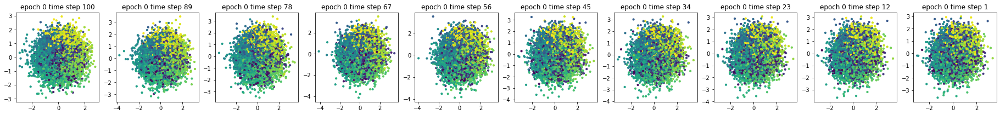

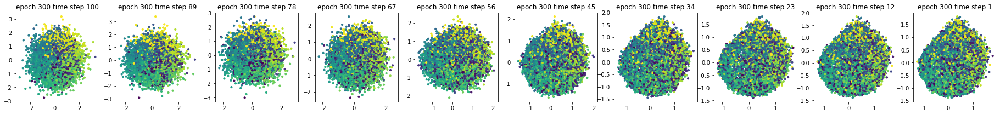

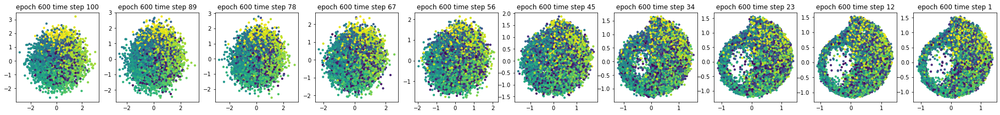

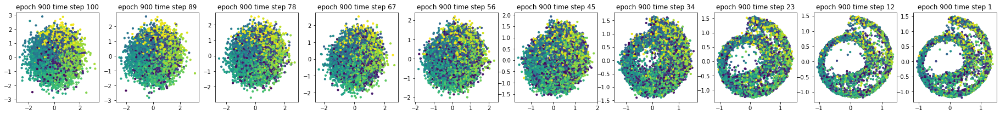

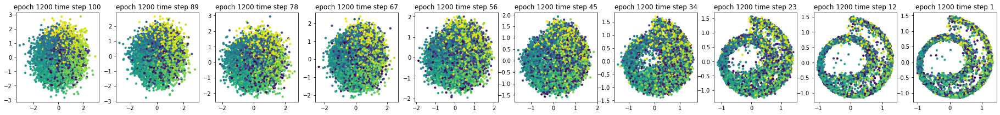

...

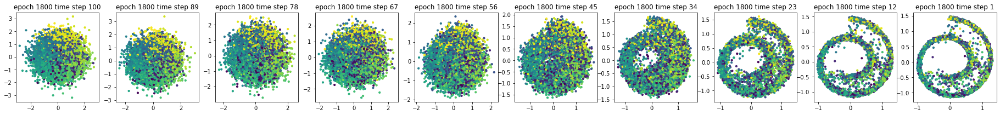

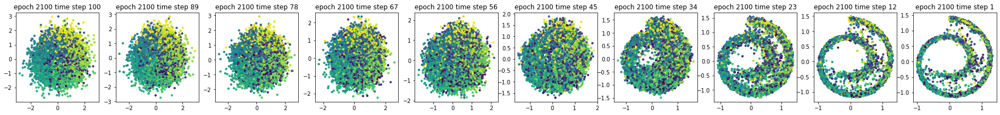

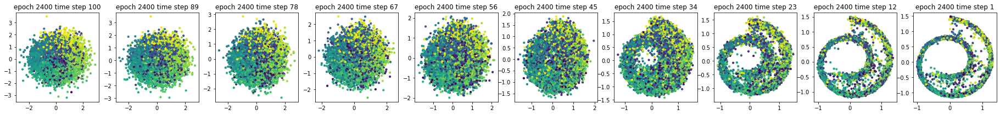

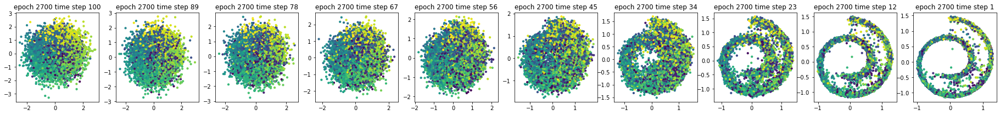

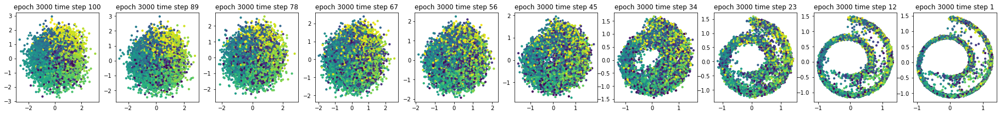

In [12]:
%%time

spiral_batch_size = config['spiral']['batch_size']
spiral_epochs = config['spiral']['epochs']

spiral_model = code_funcs.train(spiral_dataset, spiral_n_steps, device, batch_size=spiral_batch_size, epochs=spiral_epochs, color=COLOR_SPIRAL, size=10)

## Reverse Diffusion - Two Clusters

Epoch 0: loss = 0.4816
Epoch 70: loss = 0.3193
Epoch 140: loss = 0.463
Epoch 210: loss = 0.5524
Epoch 280: loss = 0.3957
Epoch 350: loss = 0.4725
Epoch 420: loss = 0.4316
Epoch 490: loss = 0.4724
Epoch 560: loss = 0.3418
Epoch 630: loss = 0.2677
Epoch 700: loss = 0.3627
CPU times: user 3min 45s, sys: 2.52 s, total: 3min 47s
Wall time: 3min 46s


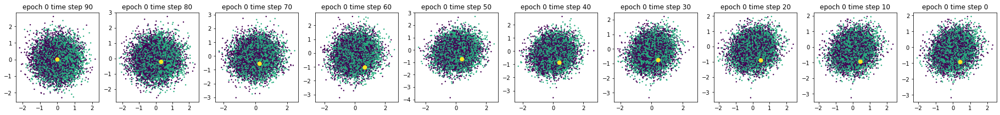

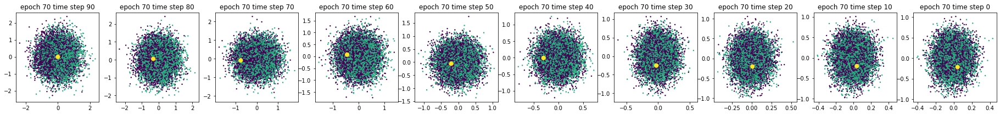

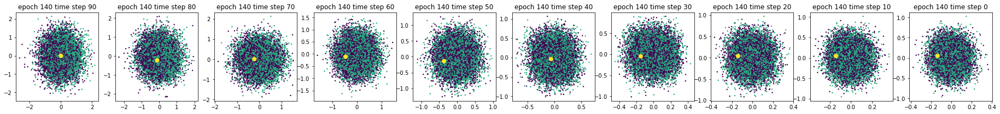

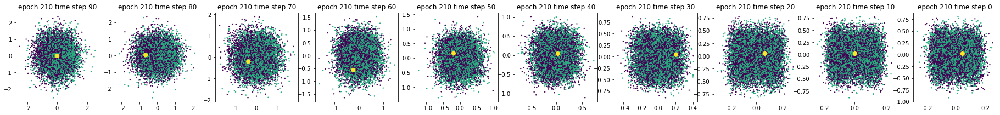

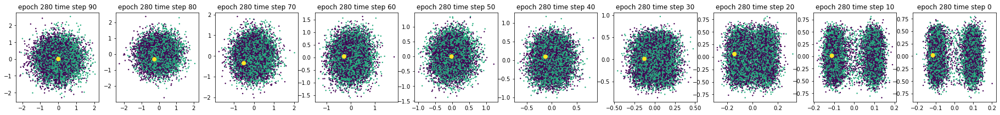

...

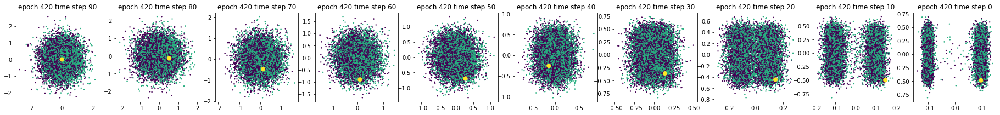

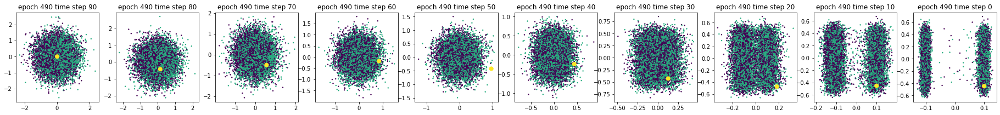

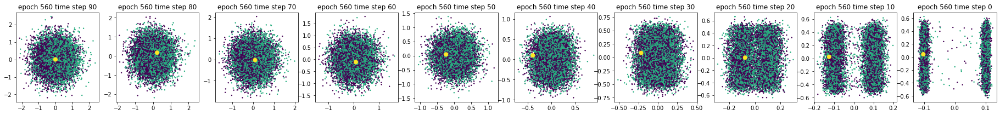

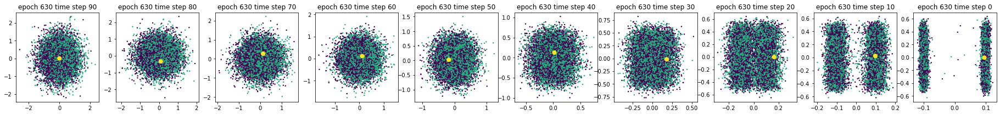

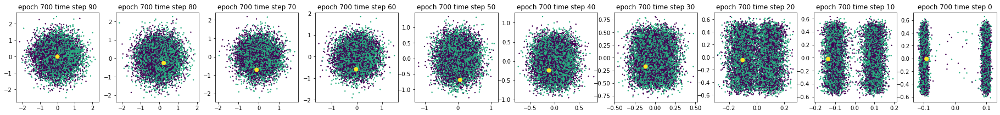

In [87]:
%%time

clusters_batch_size = config['two_clusters']['batch_size']
clusters_epochs = config['two_clusters']['epochs']

clusters_model = code_funcs.train(clusters_dataset, clusters_n_steps, device, batch_size=clusters_batch_size, epochs=clusters_epochs, color=COLOR_CLUSTERS, size=5, clusters=True)

## Bibliography

<a id="ref1"/>

[1] [Ho, J., Jain, A., & Abbeel, P. (2020). _Denoising diffusion probabilistic models_. arXiv preprint arXiv:2006.11239.](https://arxiv.org/pdf/2006.11239)

<a id="ref2"/>

[2] [Sohl-Dickstein, J., Weiss, E. A., Maheswaranathan, N., & Ganguli, S. (2015). Deep unsupervised learning using nonequilibrium thermodynamics. arXiv preprint arXiv:1503.03585.](https://arxiv.org/pdf/1503.03585)

<a id="ref3"/>

[3] [Vincent, P. (2011). A connection between score matching and denoising autoencoders. Neural computation, 23(7), 1661-1674.](http://www-labs.iro.umontreal.ca/~vincentp/Publications/smdae_techreport_1358.pdf)

<a id="ref4"/>

[4] [Song, J., Meng, C., & Ermon, S. (2020). Denoising Diffusion Implicit Models. arXiv preprint arXiv:2010.02502.](https://arxiv.org/pdf/2010.02502.pdf)

<a id="ref5"/>

[5] [Chen, N., Zhang, Y., Zen, H., Weiss, R. J., Norouzi, M., & Chan, W. (2020). _WaveGrad: Estimating gradients for waveform generation_. arXiv preprint arXiv:2009.00713.](https://arxiv.org/pdf/2009.00713)

<a id="ref6"/>

[6] [Hyvärinen, A. (2005). Estimation of non-normalized statistical models by score matching. Journal of Machine Learning Research, 6(Apr), 695-709.](http://jmlr.org/papers/volume6/hyvarinen05a/old.pdf)

<a id="ref7"/>

[7] [Song, Y., Garg, S., Shi, J., & Ermon, S. (2020, August). Sliced score matching: A scalable approach to density and score estimation. In Uncertainty in Artificial Intelligence (pp. 574-584). PMLR.](https://arxiv.org/pdf/1905.07088.pdf)

<a id="ref8"/>

[8] [Song, Y., & Ermon, S. (2019). Generative modeling by estimating gradients of the data distribution. In Advances in Neural Information Processing Systems (pp. 11918-11930).](https://arxiv.org/pdf/1907.05600.pdf)

### Inspiration and sources

https://colab.research.google.com/github/google/jax/blob/master/docs/notebooks/score_matching.ipynb
https://github.com/ermongroup/sliced_score_matching